In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import math
from category_encoders import TargetEncoder

In [2]:
df_1=pd.read_csv('G:\DATASET2\PacketBased\BenignTraffic\BenignTraffic.csv')
df_2=pd.read_csv('G:\DATASET2\PacketBased\BenignTraffic\BenignTraffic1.csv')
df_3=pd.read_csv('G:\DATASET2\PacketBased\BenignTraffic\BenignTraffic2.csv')
df_4=pd.read_csv('G:\DATASET2\PacketBased\BenignTraffic\BenignTraffic3.csv')

In [3]:
data=pd.concat([df_1,df_2,df_3,df_4],axis=0)

In [4]:
#Data shape
data.shape

(1182798, 135)

In [5]:
#Data info
print(data.info())
#Duplication data
print(data.duplicated())

<class 'pandas.core.frame.DataFrame'>
Index: 1182798 entries, 0 to 295333
Columns: 135 entries, stream to l3_ip_dst_count
dtypes: float64(97), int64(22), object(16)
memory usage: 1.2+ GB
None
0         False
1         False
2         False
3         False
4         False
          ...  
295329    False
295330    False
295331    False
295332    False
295333    False
Length: 1182798, dtype: bool


In [6]:
#Data Description
data.head()

,stream,src_mac,dst_mac,src_ip,dst_ip,src_port,dst_port,inter_arrival_time,time_since_previously_displayed_frame,port_class_dst,...,sum_p,min_p,max_p,med_p,average_p,var_p,q3_p,q1_p,iqr_p,l3_ip_dst_count
0,0,Arlo Q Indoor Camera,3c:18:a0:41:c3:a0,192.168.137.175,99.81.244.93,56891,443,0.000000,0.000000,1,...,58160.0,2908.0,2908.0,2908.0,2908.0,0.000000,2908.0,2908.0,0.0,1.0
1,0,Arlo Q Indoor Camera,3c:18:a0:41:c3:a0,192.168.137.175,99.81.244.93,56891,443,0.000164,0.000164,1,...,58160.0,2908.0,2908.0,2908.0,2908.0,0.000000,2908.0,2908.0,0.0,1.0
2,0,Arlo Q Indoor Camera,3c:18:a0:41:c3:a0,192.168.137.175,99.81.244.93,56891,443,0.000269,0.000105,1,...,56712.0,1460.0,2908.0,2908.0,2835.6,104835.200000,2908.0,2908.0,0.0,1.0
3,0,Arlo Q Indoor Camera,3c:18:a0:41:c3:a0,192.168.137.175,99.81.244.93,56891,443,0.000414,0.000145,1,...,55264.0,1460.0,2908.0,2908.0,2763.2,198635.115789,2908.0,2908.0,0.0,1.0
4,0,Arlo Q Indoor Camera,3c:18:a0:41:c3:a0,192.168.137.175,99.81.244.93,56891,443,0.001800,0.001386,1,...,53816.0,1460.0,2908.0,2908.0,2690.8,281399.747368,2908.0,2908.0,0.0,1.0


In [7]:
#Cheking of nan values
print(data.isna().sum())
#Percentage of nan_values
pourcentage_nan=(data.isna().sum()/data.shape[0])*100
print(pourcentage_nan)
#Features which has nan 
print(pourcentage_nan[pourcentage_nan>0])

stream                 0
src_mac                0
dst_mac                0
src_ip             51899
dst_ip             51899
                   ...  
var_p                  0
q3_p                   0
q1_p                   0
iqr_p                  0
l3_ip_dst_count        0
Length: 135, dtype: int64
stream             0.000000
src_mac            0.000000
dst_mac            0.000000
src_ip             4.387816
dst_ip             4.387816
                     ...   
var_p              0.000000
q3_p               0.000000
q1_p               0.000000
iqr_p              0.000000
l3_ip_dst_count    0.000000
Length: 135, dtype: float64
src_ip                    4.387816
dst_ip                    4.387816
dns_query_type           95.242552
jitter                    2.556650
stream_1_var             13.477365
src_ip_1_count            4.387816
src_ip_1_mean             4.387816
src_ip_1_var             19.271761
src_ip_mac_1_var         18.602500
channel_1_var            12.896961
stream_jitter

In [4]:
data=data.drop(columns=['dns_query_type','handshake_ciphersuites'])

In [8]:
#Cheking of nan values
print(data.isna().sum())
#Percentage of nan_values
pourcentage_nan=(data.isna().sum()/data.shape[0])*100
print(pourcentage_nan)
#Features which has nan 
print(pourcentage_nan[pourcentage_nan>0])

stream                 0
src_mac                0
dst_mac                0
src_ip             51899
dst_ip             51899
                   ...  
var_p                  0
q3_p                   0
q1_p                   0
iqr_p                  0
l3_ip_dst_count        0
Length: 133, dtype: int64
stream             0.000000
src_mac            0.000000
dst_mac            0.000000
src_ip             4.387816
dst_ip             4.387816
                     ...   
var_p              0.000000
q3_p               0.000000
q1_p               0.000000
iqr_p              0.000000
l3_ip_dst_count    0.000000
Length: 133, dtype: float64
src_ip                    4.387816
dst_ip                    4.387816
jitter                    2.556650
stream_1_var             13.477365
src_ip_1_count            4.387816
src_ip_1_mean             4.387816
src_ip_1_var             19.271761
src_ip_mac_1_var         18.602500
channel_1_var            12.896961
stream_jitter_1_sum       2.556650
stream_jitter

In [4]:
for col in data.select_dtypes(include=['number']).columns:  
    data[col].fillna(data[col].mean(), inplace=True)

In [9]:
#Cheking of nan values
print(data.isna().sum())
#Percentage of nan_values
pourcentage_nan=(data.isna().sum()/data.shape[0])*100
print(pourcentage_nan)
#Features which has nan 
print(pourcentage_nan[pourcentage_nan>0.000])

stream                 0
src_mac                0
dst_mac                0
src_ip             51899
dst_ip             51899
                   ...  
var_p                  0
q3_p                   0
q1_p                   0
iqr_p                  0
l3_ip_dst_count        0
Length: 133, dtype: int64
stream             0.000000
src_mac            0.000000
dst_mac            0.000000
src_ip             4.387816
dst_ip             4.387816
                     ...   
var_p              0.000000
q3_p               0.000000
q1_p               0.000000
iqr_p              0.000000
l3_ip_dst_count    0.000000
Length: 133, dtype: float64
src_ip    4.387816
dst_ip    4.387816
dtype: float64


In [5]:
data=data.dropna()

In [6]:
data=data.drop(columns=['src_mac','dst_mac'])

In [14]:
print(data['device_mac'].value_counts())

device_mac
Arlo Q Indoor Camera                          463361
Nest Indoor Camera                            143546
ac:17:02:05:34:27                              93156
3c:18:a0:41:c3:a0                              56990
Amazon Echo Show                               53439
                                               ...  
dc:a6:32:c9:e4:ab                                 14
dc:a6:32:c9:e5:a4                                 14
dc:a6:32:c9:e5:ef                                 13
Wemo smart plug 1 (Wemo id: Wemo.Mini.AD3)        10
e4:5f:01:55:90:c4                                  9
Name: count, Length: 72, dtype: int64


<Axes: xlabel='device_mac'>

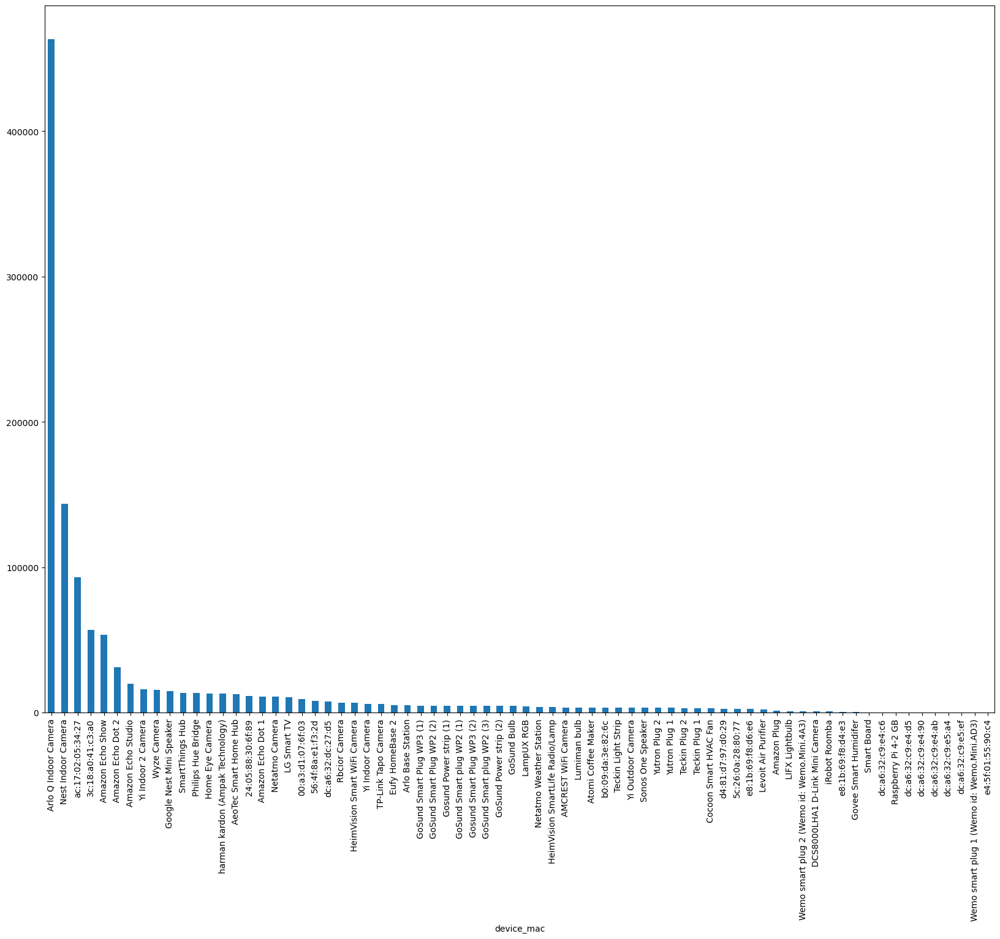

In [17]:
data['device_mac'].value_counts().plot(kind='bar',figsize=(20,15))

In [17]:
#Numerical and categorical features
numerical_features=data.select_dtypes(include=['number']).columns
categorical_features=data.select_dtypes(include=['object']).columns

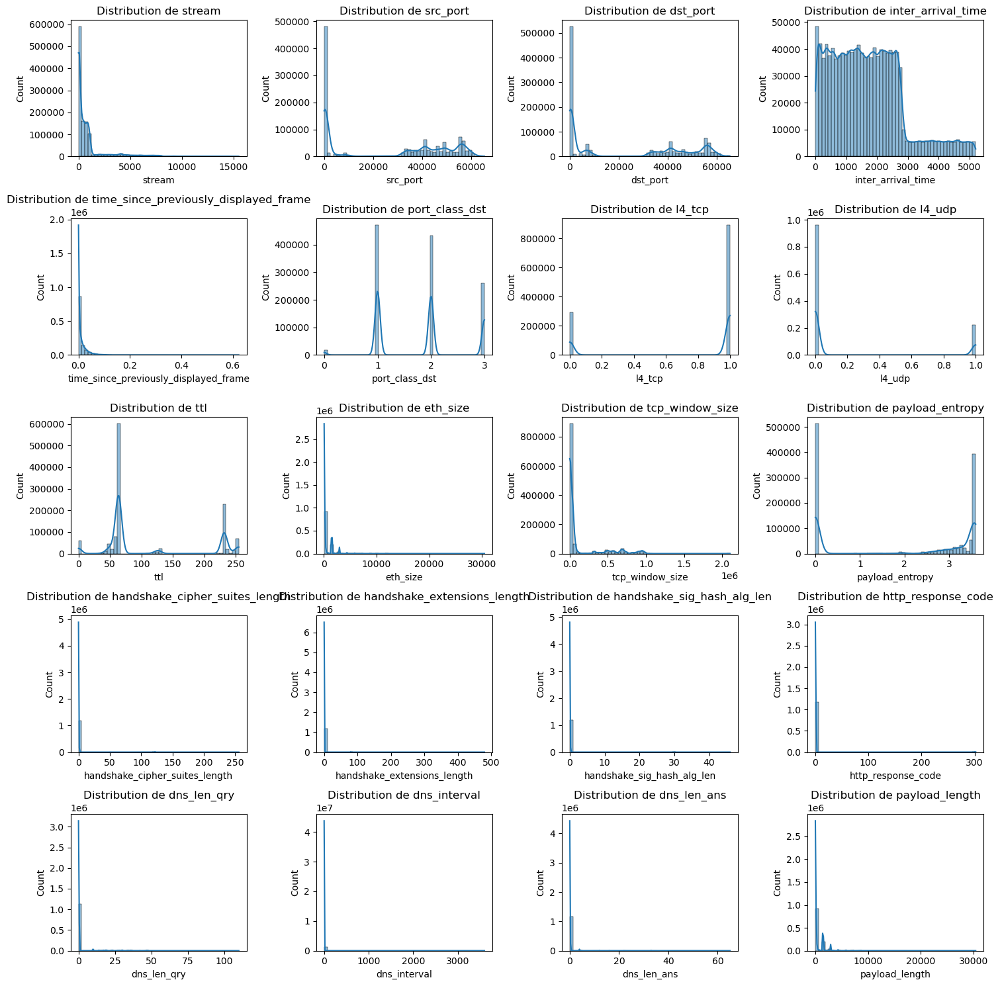

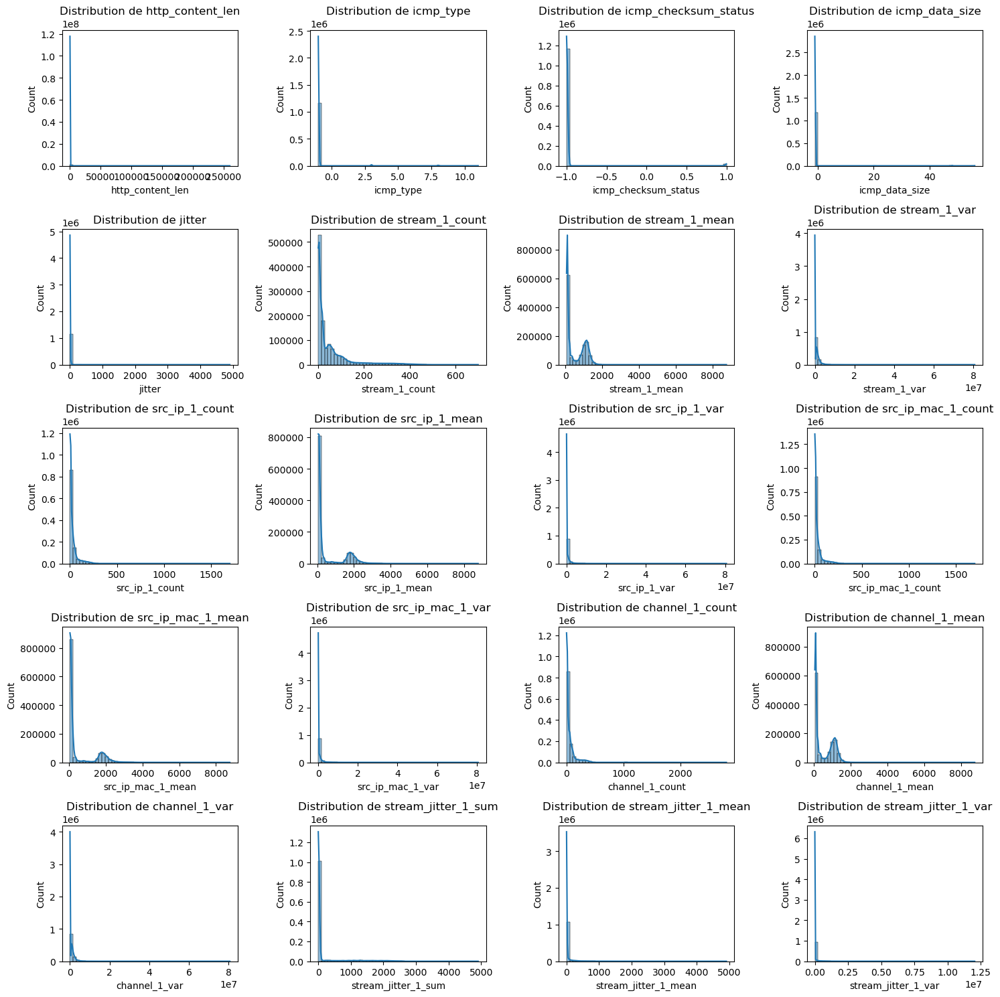

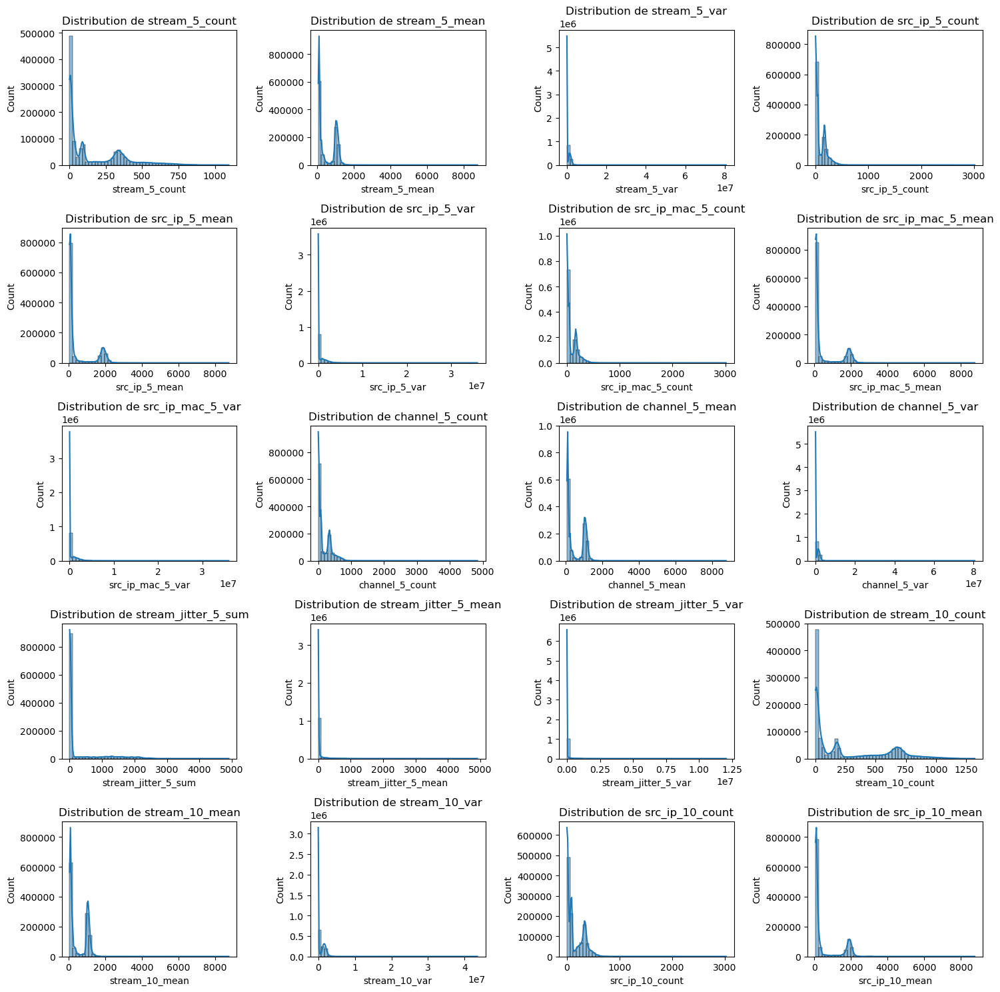

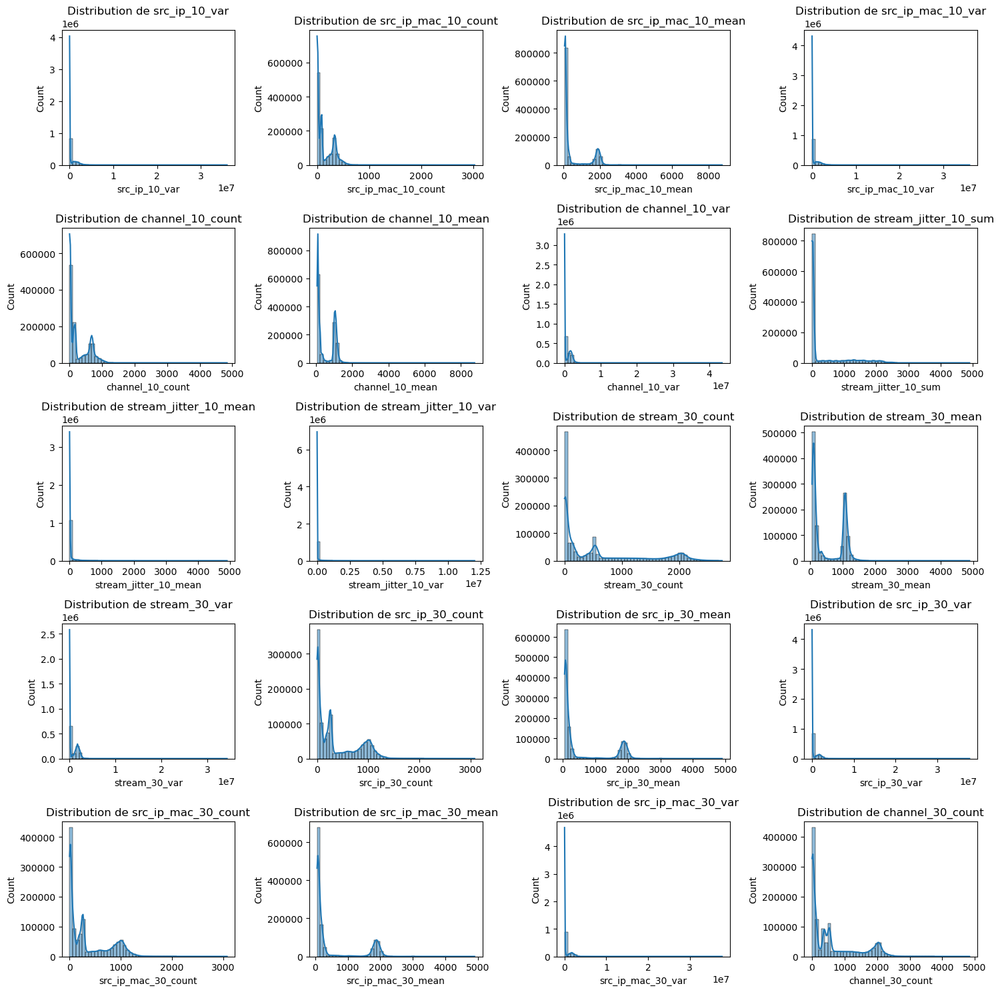

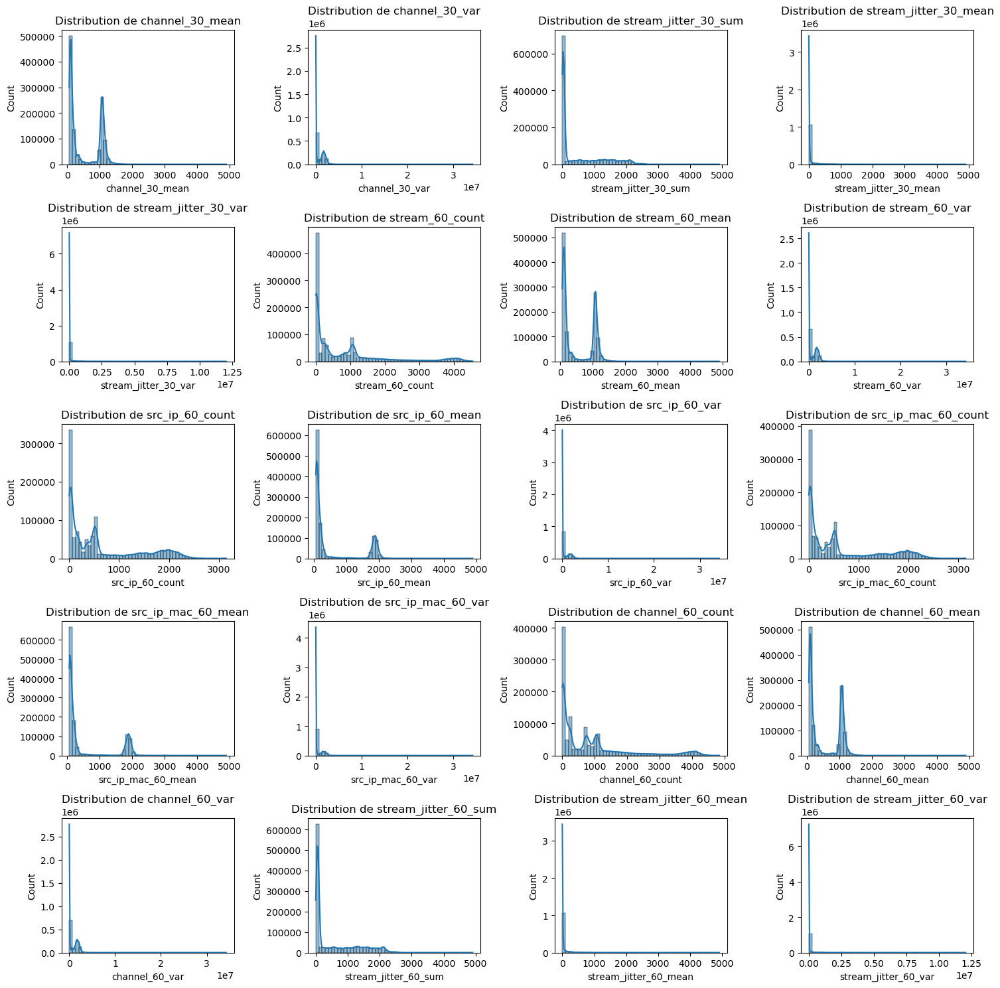

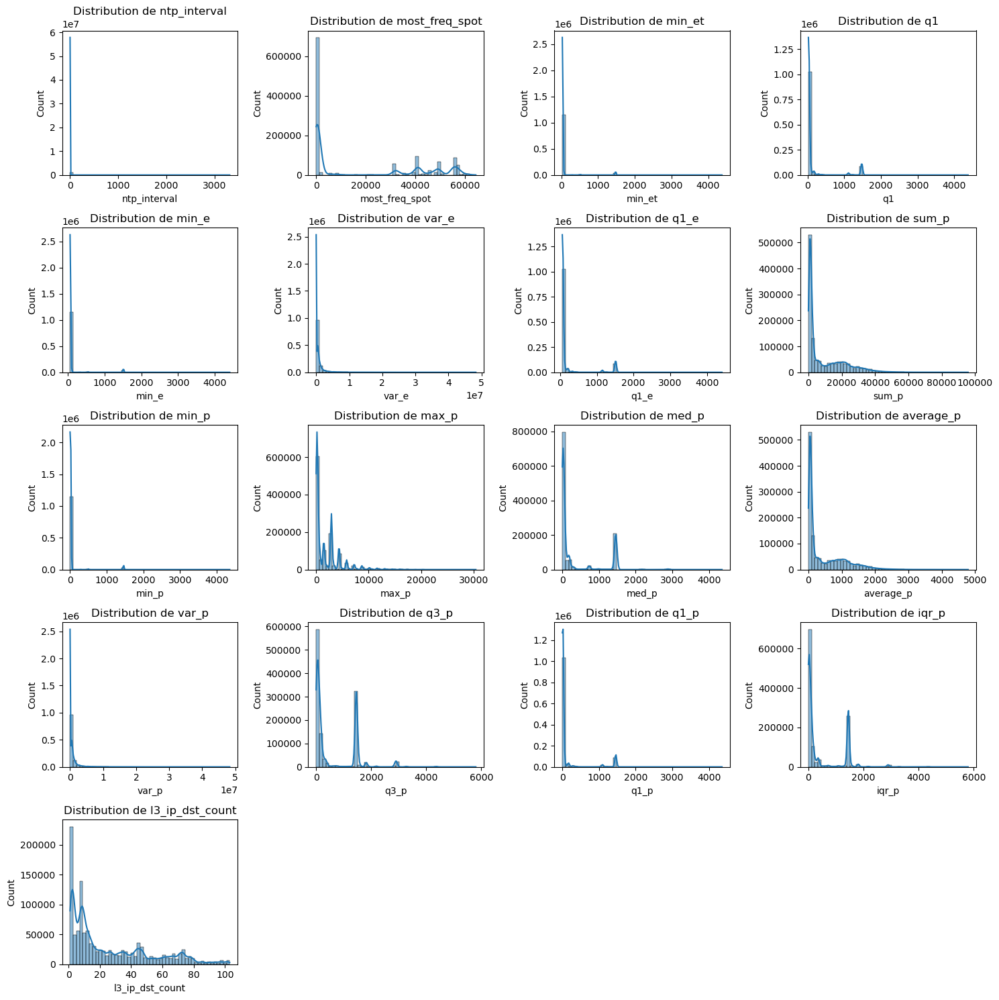

In [21]:
# Sélectionner toutes les colonnes numériques
num_features = len(numerical_features)

# Paramètres pour diviser en groupes de 20 features
features_per_plot = 20
num_plots = math.ceil(num_features / features_per_plot)

for plot_idx in range(num_plots):
    start_idx = plot_idx * features_per_plot
    end_idx = min(start_idx + features_per_plot, num_features)
    subset_features = numerical_features[start_idx:end_idx]

    num_rows = math.ceil(len(subset_features) / 4)  # 4 colonnes fixes
    plt.figure(figsize=(15, num_rows * 3))

    for i, feature in enumerate(subset_features):
        plt.subplot(num_rows, 4, i + 1)
        sns.histplot(data[feature], bins=50, kde=True)
        plt.title(f"Distribution de {feature}")

    plt.tight_layout()
    plt.show()  # Affiche chaque lot séparément

In [13]:
data['jitter'].value_counts()

jitter
0.000001     82071
14.088737    30236
0.000002     21498
0.000003      7872
0.000004      3637
             ...  
0.314474         1
0.131293         1
1.286145         1
0.455973         1
0.385920         1
Name: count, Length: 325460, dtype: int64

In [14]:
scale=StandardScaler()

In [18]:
X_scale=scale.fit_transform(data[numerical_features])

In [19]:
pca=PCA()

In [20]:
X_scale=pd.DataFrame(X_scale,columns=numerical_features)

In [21]:
X_pca=pca.fit_transform(X_scale)

In [22]:
columns = ['PC' + str(i+1) for i in range(X_pca.shape[1])]
X_pca_df = pd.DataFrame(X_pca, columns=columns)

In [23]:
X_pca_df.shape

(1130899, 119)

In [25]:
pca.explained_variance_ratio_

array([3.66511182e-01, 1.04974176e-01, 8.66040321e-02, 4.35451506e-02,
       3.88208436e-02, 3.21810251e-02, 2.62554386e-02, 2.20923436e-02,
       2.16933859e-02, 1.94001866e-02, 1.82235500e-02, 1.56558276e-02,
       1.39766932e-02, 1.22917938e-02, 1.10512177e-02, 9.86768133e-03,
       9.42906492e-03, 9.01127279e-03, 8.70453340e-03, 8.48093054e-03,
       8.30006790e-03, 7.91064089e-03, 7.76349986e-03, 7.33087578e-03,
       7.22971450e-03, 6.34228048e-03, 6.13563294e-03, 5.22560451e-03,
       4.91931905e-03, 4.88051691e-03, 4.40314464e-03, 4.30974038e-03,
       4.13013164e-03, 3.81824362e-03, 3.20733792e-03, 2.96348569e-03,
       2.78733405e-03, 2.55350915e-03, 2.21634059e-03, 2.14493975e-03,
       2.08379181e-03, 1.90366615e-03, 1.81355213e-03, 1.57100688e-03,
       1.44544999e-03, 1.31136317e-03, 1.16964726e-03, 1.08424879e-03,
       9.77927993e-04, 8.24456751e-04, 7.93797578e-04, 7.44057766e-04,
       7.15531705e-04, 7.01795622e-04, 5.69176768e-04, 5.26790540e-04,
      

In [24]:
data.shape

(1130899, 133)

In [26]:
explained_variance=pd.Series(dict(zip(X_pca_df.columns,100*pca.explained_variance_ratio_)))

<Axes: >

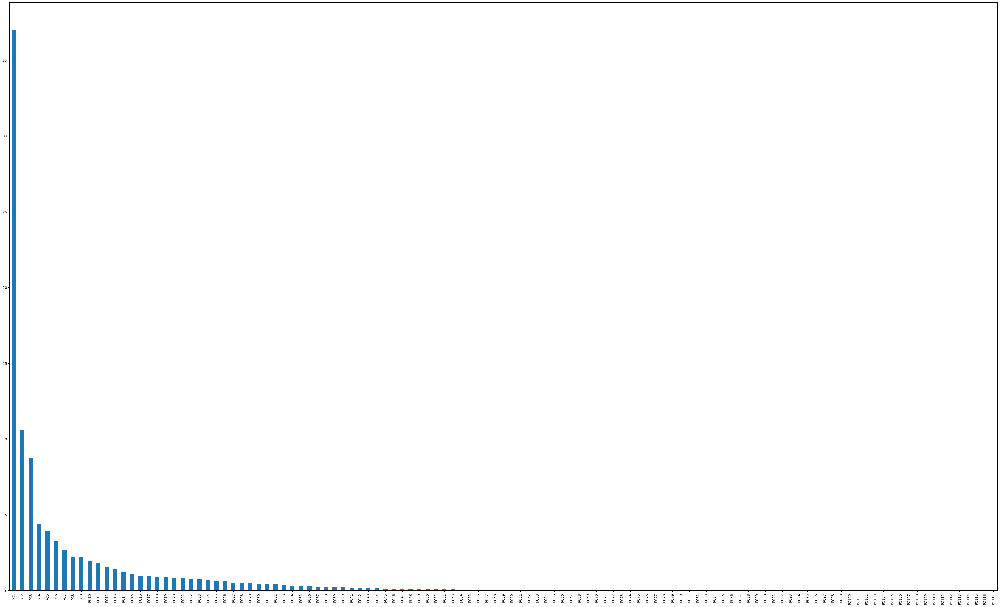

In [41]:
explained_variance.plot(kind='bar',figsize=(50,30))

In [42]:
explained_variance

PC1      3.696437e+01
PC2      1.058714e+01
PC3      8.734166e+00
PC4      4.391731e+00
PC5      3.915222e+00
             ...     
PC113    3.713834e-08
PC114    2.711017e-30
PC115    6.186447e-31
PC116    1.610560e-31
PC117    4.856460e-32
Length: 117, dtype: float64

C:\Users\mitsoumaprice\AppData\Local\Temp\ipykernel_19436\2991750334.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_pca_df['device_mac'] = data['device_mac'].values


<IPython.core.display.Javascript object>


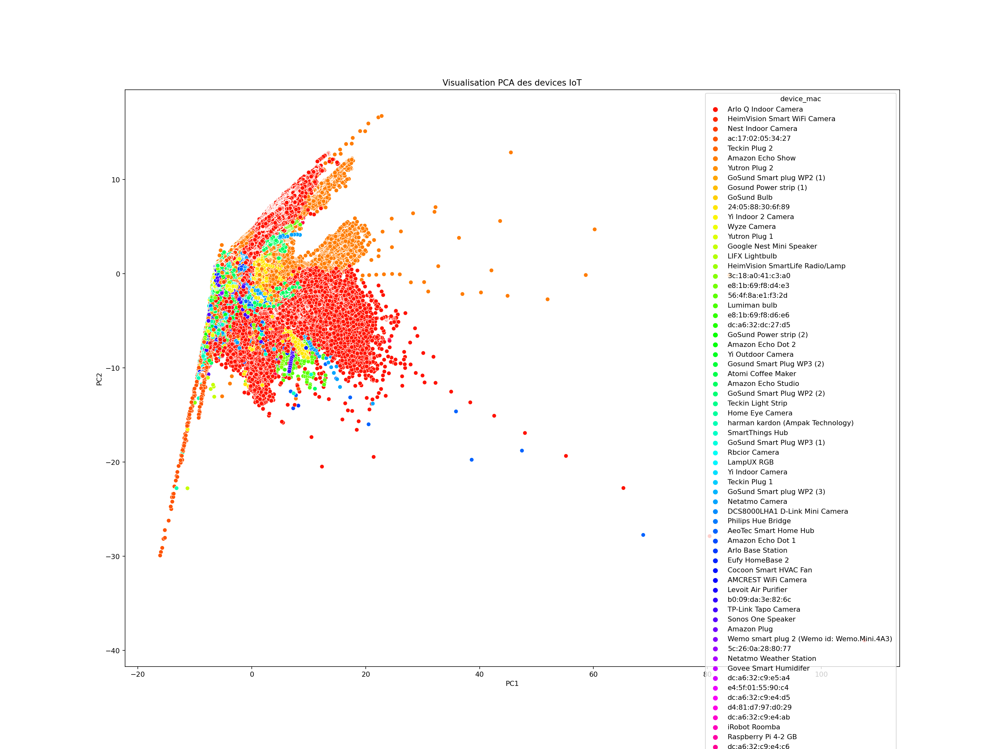

In [30]:
%matplotlib notebook
# Supposons que 'device_type' est la colonne qui catégorise les types de devices
device_types = data['device_mac'].unique()

# Associer chaque device_type à une couleur
palette = sns.color_palette("hsv", len(device_types))  # Palette de couleurs
color_dict = dict(zip(device_types, palette))  # Associer types à couleurs

# Ajouter la couleur associée au DataFrame X_pca_df
X_pca_df['device_mac'] = data['device_mac'].values  

# Tracer le scatter plot avec la couleur des devices
plt.figure(figsize=(20, 15))
sns.scatterplot(x='PC1', y='PC2', hue='device_mac', data=X_pca_df, palette=color_dict, legend=True)

plt.title("Visualisation PCA des devices IoT")
plt.show()

In [63]:
%matplotlib notebook
# Supposons que 'device_type' est la colonne qui catégorise les types de devices
device_types = data['device_mac'].unique()

# Associer chaque device_type à une couleur
palette = sns.color_palette("husl", len(device_types))  # Palette de couleurs
color_dict = dict(zip(device_types, palette))  # Associer types à couleurs

# Ajouter la couleur associée au DataFrame X_pca_df
X_pca_df['device_type'] = data['device_mac'].values  

# Créer un plot 3D
  # Change values to adjust the view
fig = plt.figure(figsize=(100, 80))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=60)

# Boucle pour afficher chaque point avec la bonne couleur
for device in device_types:
    subset = X_pca_df[X_pca_df['device_type'] == device]
    ax.scatter(subset['PC1'], subset['PC2'], subset['PC3'], 
               color=color_dict[device], label=device, s=50)

# Labels et titre
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_title("Visualisation 3D des Composantes Principales (PCA)")

# Afficher la légende
ax.legend()

plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


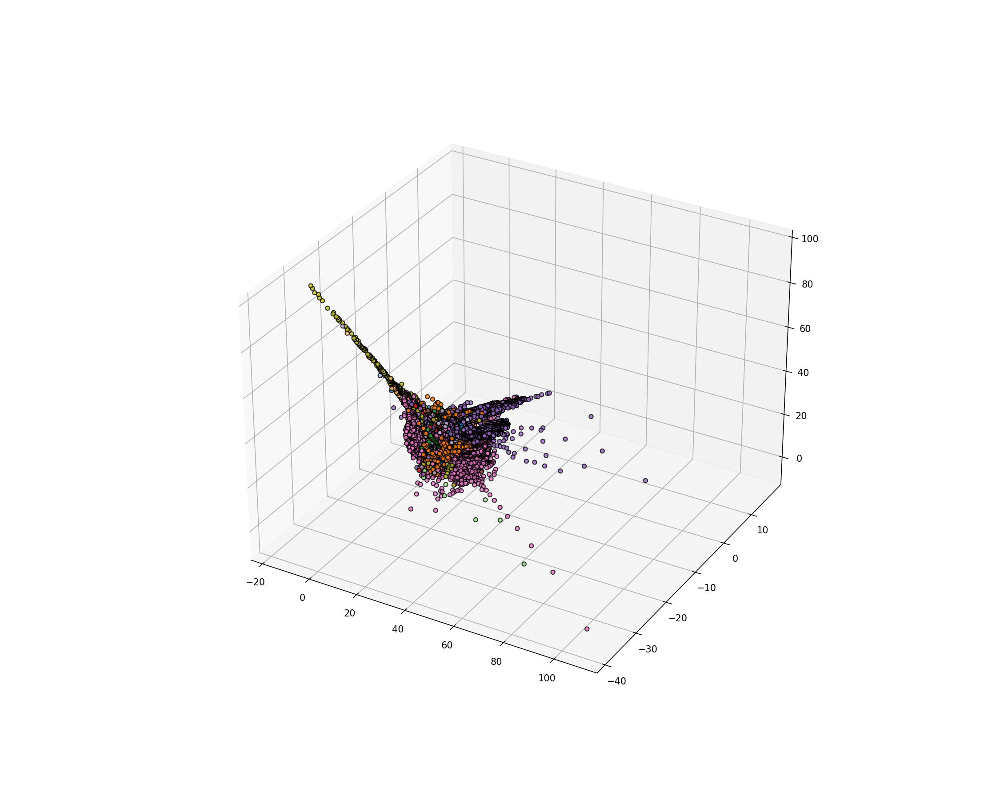

In [27]:
from matplotlib.colors import ListedColormap
%matplotlib notebook
# Convert category to numerical index
device_types = data['device_mac'].astype('category').cat.codes
cmap = ListedColormap(sns.color_palette("tab20", 71).as_hex())  # Up to 20 colors

fig = plt.figure(figsize=(15, 12))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_pca_df['PC1'], X_pca_df['PC2'], X_pca_df['PC3'], 
           c=device_types, cmap=cmap, alpha=0.8, edgecolors='k')

plt.show()

In [58]:
categorical_features.drop('device_mac')
data1=data

In [59]:
for j in categorical_features:
    if data1[j].value_counts().size <=35:
        data1=pd.get_dummies(data1,columns=[j],drop_first=False,dtype=int )

In [60]:
cat=data1.select_dtypes(include=['object']).columns

In [90]:
A=pd.Series(dict(zip(data1['src_ip'],data['device_mac'])))
B=pd.Series(dict(zip(data1['dst_ip'],data['device_mac'])))            

In [95]:
# Étape 1 : Compter les IPs uniques par device_mac
device_ip_counts = data1.groupby('device_mac')['src_ip'].nunique()

# Étape 2 : Filtrer ceux qui ont plusieurs IPs
multiple_ips = device_ip_counts[device_ip_counts > 1].index  # Liste des device_mac concernés

# Étape 3 : Extraire leurs IPs
device_ip_mapping = data1[data1['device_mac'].isin(multiple_ips)].groupby('device_mac')['src_ip'].unique()

# Affichage des device_mac avec leurs IPs associées
for device, ips in device_ip_mapping.items():
    print(f"Device MAC: {device} → IPs: {list(ips)}")

Device MAC: 24:05:88:30:6f:89 → IPs: ['192.168.137.249', '192.168.137.207', '192.168.137.1', '142.251.41.42', '142.251.33.170', '8.8.8.8', '142.251.33.174', '172.217.165.10', '142.251.41.74', '142.251.41.46', '142.251.41.78', '142.251.32.74', '172.217.1.10']
Device MAC: 3c:18:a0:41:c3:a0 → IPs: ['54.148.153.241', '192.168.137.1', '17.57.144.10', '47.90.209.117', '47.254.89.110', '52.12.196.80', '161.117.254.158', '206.108.0.131', '3.221.182.58', '18.182.200.45', '47.112.162.49', '34.158.253.218', '18.221.14.3', '172.253.115.188', '3.12.33.198', '35.162.13.26', '54.205.158.199', '35.168.43.144', '47.88.56.147', '205.174.165.65', '192.99.160.133', '147.135.36.150', '66.23.204.162', '52.43.232.245', '100.21.156.247', '34.210.19.179', '54.164.164.148', '20.13.28.210', '34.235.4.153', '18.223.127.200', '54.153.101.7', '34.211.189.2', '8.8.8.8', '44.235.194.199', '100.20.212.253', '52.206.116.3', '35.161.158.54', '51.255.64.17', '44.238.43.136', '52.35.183.224', '3.208.160.215', '205.174.165

In [11]:
encoder=TargetEncoder(smoothing=5)

In [10]:
data1=data

In [12]:
data1['src_ip_encode']=encoder.fit_transform(data1['src_ip'],data1['device_mac'])

In [15]:
data1

,stream,src_mac,dst_mac,src_ip,dst_ip,src_port,dst_port,inter_arrival_time,time_since_previously_displayed_frame,port_class_dst,...,min_p,max_p,med_p,average_p,var_p,q3_p,q1_p,iqr_p,l3_ip_dst_count,src_ip_encode
0,0,Arlo Q Indoor Camera,3c:18:a0:41:c3:a0,192.168.137.175,99.81.244.93,56891,443,0.000000,0.000000,1,...,2908.0,2908.0,2908.0,2908.00,0.000000,2908.0,2908.00,0.00,1.0,12.0
1,0,Arlo Q Indoor Camera,3c:18:a0:41:c3:a0,192.168.137.175,99.81.244.93,56891,443,0.000164,0.000164,1,...,2908.0,2908.0,2908.0,2908.00,0.000000,2908.0,2908.00,0.00,1.0,12.0
2,0,Arlo Q Indoor Camera,3c:18:a0:41:c3:a0,192.168.137.175,99.81.244.93,56891,443,0.000269,0.000105,1,...,1460.0,2908.0,2908.0,2835.60,104835.200000,2908.0,2908.00,0.00,1.0,12.0
3,0,Arlo Q Indoor Camera,3c:18:a0:41:c3:a0,192.168.137.175,99.81.244.93,56891,443,0.000414,0.000145,1,...,1460.0,2908.0,2908.0,2763.20,198635.115789,2908.0,2908.00,0.00,1.0,12.0
4,0,Arlo Q Indoor Camera,3c:18:a0:41:c3:a0,192.168.137.175,99.81.244.93,56891,443,0.001800,0.001386,1,...,1460.0,2908.0,2908.0,2690.80,281399.747368,2908.0,2908.00,0.00,1.0,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295329,1187,Arlo Q Indoor Camera,3c:18:a0:41:c3:a0,192.168.137.175,99.81.244.93,33992,443,2845.862184,0.000422,1,...,12.0,1460.0,1072.5,769.65,523120.976316,1460.0,12.00,1448.00,103.0,12.0
295330,1187,Arlo Q Indoor Camera,3c:18:a0:41:c3:a0,192.168.137.175,99.81.244.93,33992,443,2845.862458,0.000274,1,...,12.0,1945.0,1460.0,866.30,555783.589474,1460.0,12.00,1448.00,103.0,12.0
295331,1187,Arlo Q Indoor Camera,3c:18:a0:41:c3:a0,192.168.137.175,99.81.244.93,33992,443,2845.862961,0.000503,1,...,12.0,1945.0,1460.0,938.70,530405.484211,1460.0,12.00,1448.00,103.0,12.0
295332,1187,Arlo Q Indoor Camera,3c:18:a0:41:c3:a0,192.168.137.175,99.81.244.93,33992,443,2845.863128,0.000167,1,...,12.0,1945.0,1460.0,1011.10,493992.094737,1460.0,12.00,1448.00,103.0,12.0
